![alt text](https://drive.google.com/uc?export=view&id=1UXScsVx_Wni_JuDdB8LeTnM6jsPfIwkW)

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;"> NN Learning Project Part A
    
<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Submitted by
    
<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Shameer.Sutar


• DOMAIN: Electronics and Telecommunication

• CONTEXT: A communications equipment manufacturing company has a product which is responsible for emitting informative signals. 
Company wants to build a machine learning model which can help the company to predict the equipment’s signal quality using various parameters. 

• DATA DESCRIPTION: The data set contains information on various signal tests performed:

1. Parameters: Various measurable signal parameters.

2. Signal_Quality: Final signal strength or quality.

• PROJECT OBJECTIVE: To build a classifier which can use the given parameters to determine the signal strength or quality

In [26]:
#Importing important libraries
import numpy as np
import pandas as pd
import h5py
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [55]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report,precision_score, recall_score, f1_score, precision_recall_curve, auc
import tensorflow as tf
from keras.models import Sequential
from keras.utils.np_utils import to_categorical
from keras.layers import Activation, Dense
from keras.layers import BatchNormalization, Dropout
from keras import optimizers
import warnings
warnings.filterwarnings("ignore")

# Steps and tasks:

# 1. Data import and Understanding

## A. Read the ‘Signals.csv’ as DataFrame and import required libraries.

In [15]:
# Read the csv file and store in a dataframe
data = pd.read_csv('NN Project Data - Signal.csv')

# Show data header
data.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 1      1599 non-null   float64
 1   Parameter 2      1599 non-null   float64
 2   Parameter 3      1599 non-null   float64
 3   Parameter 4      1599 non-null   float64
 4   Parameter 5      1599 non-null   float64
 5   Parameter 6      1599 non-null   float64
 6   Parameter 7      1599 non-null   float64
 7   Parameter 8      1599 non-null   float64
 8   Parameter 9      1599 non-null   float64
 9   Parameter 10     1599 non-null   float64
 10  Parameter 11     1599 non-null   float64
 11  Signal_Strength  1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [17]:
data.dtypes

Parameter 1        float64
Parameter 2        float64
Parameter 3        float64
Parameter 4        float64
Parameter 5        float64
Parameter 6        float64
Parameter 7        float64
Parameter 8        float64
Parameter 9        float64
Parameter 10       float64
Parameter 11       float64
Signal_Strength      int64
dtype: object

## B. Check for missing values and print percentage for each attribute. 

In [19]:
data.isnull().sum()*100/len(data)

Parameter 1        0.0
Parameter 2        0.0
Parameter 3        0.0
Parameter 4        0.0
Parameter 5        0.0
Parameter 6        0.0
Parameter 7        0.0
Parameter 8        0.0
Parameter 9        0.0
Parameter 10       0.0
Parameter 11       0.0
Signal_Strength    0.0
dtype: float64

In [20]:
# Check if any column has null values remaining
data.columns[data.isna().any()].tolist()

[]

In [22]:
# EDA using Fast-ML
from fast_ml import eda

eda.df_info(data)

,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
Parameter 1,float64,Numerical,96,"[7.4, 7.8, 11.2, 7.9, 7.3, 7.5, 6.7, 5.6, 8.9,...",0,0.0
Parameter 2,float64,Numerical,143,"[0.7, 0.88, 0.76, 0.28, 0.66, 0.6, 0.65, 0.58,...",0,0.0
Parameter 3,float64,Numerical,80,"[0.0, 0.04, 0.56, 0.06, 0.02, 0.36, 0.08, 0.29...",0,0.0
Parameter 4,float64,Numerical,91,"[1.9, 2.6, 2.3, 1.8, 1.6, 1.2, 2.0, 6.1, 3.8, ...",0,0.0
Parameter 5,float64,Numerical,153,"[0.076, 0.098, 0.092, 0.075, 0.069, 0.065, 0.0...",0,0.0
Parameter 6,float64,Numerical,60,"[11.0, 25.0, 15.0, 17.0, 13.0, 9.0, 16.0, 52.0...",0,0.0
Parameter 7,float64,Numerical,144,"[34.0, 67.0, 54.0, 60.0, 40.0, 59.0, 21.0, 18....",0,0.0
Parameter 8,float64,Numerical,436,"[0.9978, 0.9968, 0.997, 0.998, 0.9964, 0.9946,...",0,0.0
Parameter 9,float64,Numerical,89,"[3.51, 3.2, 3.26, 3.16, 3.3, 3.39, 3.36, 3.35,...",0,0.0
Parameter 10,float64,Numerical,96,"[0.56, 0.68, 0.65, 0.58, 0.46, 0.47, 0.57, 0.8...",0,0.0


No missing values found in any column of data.

## C. Check for presence of duplicate records in the dataset and impute with appropriate method. 

In [23]:
# Show duplicate rows in the dataframe
data[data.duplicated()]

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


In [24]:
# dropping duplicate values
data.drop_duplicates(keep=False,inplace=True)
data[data.duplicated()]

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength


## D. Visualise distribution of the target variable.

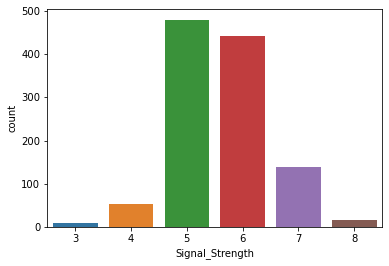

In [27]:
# Signal Strength is the target variable
sns.countplot(data['Signal_Strength']);

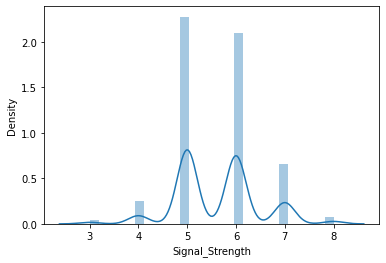

In [28]:
sns.distplot(data['Signal_Strength']);

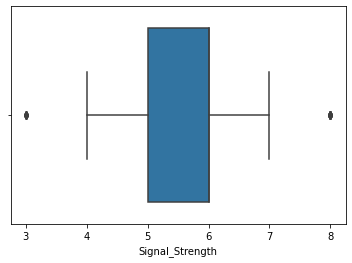

In [29]:
sns.boxplot(data['Signal_Strength']);

## E. Share insights from the initial data analysis (at least 2).

In [30]:
# Generate Profile Report
# Import Library
from pandas_profiling import ProfileReport

# Perform Pandas Profiling
data_profile = ProfileReport(data, title="Equipment Signal Quality")
data_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

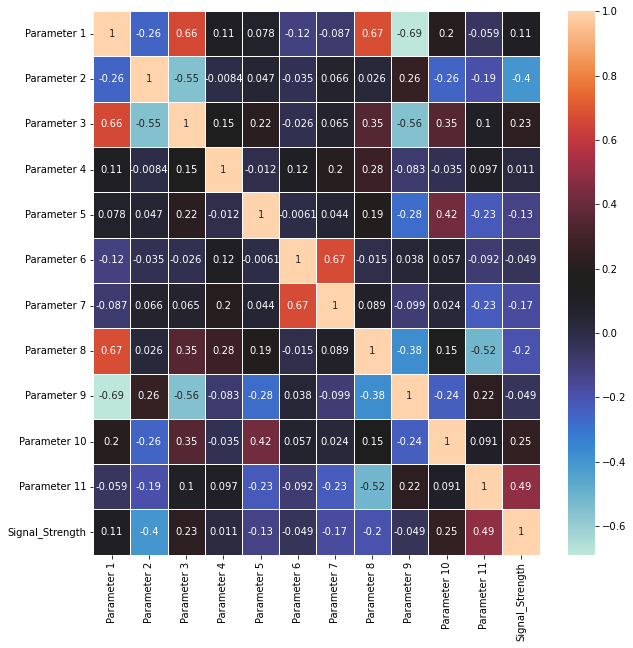

In [39]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(data.corr(), annot=True, linewidths=.5, ax=ax,cmap='icefire');

* Parameter 1 and 9 are highly correlated (negatively).
* Most of the equipments have a signal strength of 5 or 6.

# 2. Data preprocessing

## A. Split the data into X & Y. 

In [40]:
# Let independent variables be all the parameters
X = data.drop(columns='Signal_Strength', axis=1)
X.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4


In [41]:
# The target variable is Signal_Strength
y = data['Signal_Strength']
y

1       5
2       5
3       6
5       5
6       5
       ..
1593    6
1594    5
1595    6
1597    5
1598    6
Name: Signal_Strength, Length: 1139, dtype: int64

## B. Split the data into train & test with 70:30 proportion.

In [42]:
# Import Library
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

X_train.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11
525,10.4,0.64,0.24,2.8,0.105,29.0,53.0,0.99980,3.24,0.67,9.9
1004,8.2,0.43,0.29,1.6,0.081,27.0,45.0,0.99603,3.25,0.54,10.3
58,7.8,0.59,0.18,2.3,0.076,17.0,54.0,0.99750,3.43,0.59,10.0
1317,9.9,0.44,0.46,2.2,0.091,10.0,41.0,0.99638,3.18,0.69,11.9
894,7.2,0.63,0.03,2.2,0.080,17.0,88.0,0.99745,3.53,0.58,9.8


## C. Print shape of all the 4 variables and verify if train and test data is in sync. 

In [43]:
print('Shape of Train Data of Independent Variables:',X_train.shape)
print('Shape of Train Data of Target Variables:',y_train.shape)
print('Shape of Test Data of Independent Variables:',X_test.shape)
print('Shape of Test Data of Target Variables:',y_test.shape)

Shape of Train Data of Independent Variables: (797, 11)
Shape of Train Data of Target Variables: (797,)
Shape of Test Data of Independent Variables: (342, 11)
Shape of Test Data of Target Variables: (342,)


## D. Normalise the train and test data with appropriate method. 

In [44]:
# Import Library
from sklearn.preprocessing import MinMaxScaler

# define min max scaler
scaler = MinMaxScaler()

# fit & transform train data
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled

array([[0.51327434, 0.41025641, 0.30379747, ..., 0.33043478, 0.20606061,
        0.23076923],
       [0.31858407, 0.23076923, 0.36708861, ..., 0.33913043, 0.12727273,
        0.29230769],
       [0.28318584, 0.36752137, 0.2278481 , ..., 0.49565217, 0.15757576,
        0.24615385],
       ...,
       [0.57522124, 0.23931624, 0.53164557, ..., 0.33913043, 0.14545455,
        0.30769231],
       [0.3539823 , 0.26495726, 0.37974684, ..., 0.3826087 , 0.12121212,
        0.15384615],
       [0.23893805, 0.36324786, 0.2278481 , ..., 0.39130435, 0.12727273,
        0.21538462]])

In [45]:
# transform test data
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[0.34513274, 0.23931624, 0.63291139, ..., 0.13043478, 0.46666667,
        0.15384615],
       [0.24778761, 0.16239316, 0.41772152, ..., 0.43478261, 0.16363636,
        0.53846154],
       [0.48672566, 0.09401709, 0.6835443 , ..., 0.26956522, 0.12121212,
        0.63076923],
       ...,
       [0.21238938, 0.23076923, 0.02531646, ..., 0.42608696, 0.29090909,
        0.33846154],
       [0.20353982, 0.24786325, 0.13924051, ..., 0.3826087 , 0.19393939,
        0.46153846],
       [0.36283186, 0.51709402, 0.27848101, ..., 0.20869565, 0.13333333,
        0.15384615]])

## E. Transform Labels into format acceptable by Neural Network

In [46]:
# The target variable Signal_Strength has following values
y.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [47]:
# Training target has following unique values
y_train.unique()

array([5, 6, 7, 3, 4, 8], dtype=int64)

In [48]:
# convert integers to dummy variables (i.e. one hot encoded)
from keras.utils import np_utils
dummy_y_train = np_utils.to_categorical(y_train)
dummy_y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [49]:
print(y_train[1])
print(dummy_y_train[0])

5
[0. 0. 0. 0. 0. 1. 0. 0. 0.]


In [50]:
# Test target unique values
y_test.unique()

array([5, 6, 7, 8, 4, 3], dtype=int64)

In [51]:
# Apply the same letter transformation to test target labels
dummy_y_test = np_utils.to_categorical(y_test)
dummy_y_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [52]:
dummy_y_test[0]

array([0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32)

In [53]:
X_train_scaled.shape

(797, 11)

# 3. Model Training & Evaluation using Neural Network

## A. Design a Neural Network to train a classifier.

In [56]:
# Design the NN
classifier = Sequential()

# Input Layer
classifier.add(Dense(activation = 'relu', input_dim = 11, units=10, kernel_initializer='uniform'))

# Add 1st hidden layer
classifier.add(Dense(10, activation='sigmoid', kernel_initializer='uniform'))

# Add output layer
classifier.add(Dense(9, activation = 'softmax', kernel_initializer='uniform'))

# Compile the model
classifier.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

# Network Summary
classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                120       
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                                 
 dense_2 (Dense)             (None, 9)                 99        
                                                                 
Total params: 329
Trainable params: 329
Non-trainable params: 0
_________________________________________________________________


## B. Train the classifier using previously designed Architecture 

In [57]:
training = classifier.fit(X_train_scaled, dummy_y_train, 
               validation_data=(X_test_scaled,dummy_y_test), 
               epochs=100, batch_size=32)

Epoch 1/100
25/25 [==============================] - 1s 17ms/step - loss: 2.1284 - accuracy: 0.2823 - val_loss: 2.0334 - val_accuracy: 0.4181
Epoch 2/100
25/25 [==============================] - 0s 4ms/step - loss: 1.9556 - accuracy: 0.4228 - val_loss: 1.8798 - val_accuracy: 0.4181
Epoch 3/100
25/25 [==============================] - 0s 5ms/step - loss: 1.8182 - accuracy: 0.4228 - val_loss: 1.7593 - val_accuracy: 0.4181
Epoch 4/100
25/25 [==============================] - 0s 4ms/step - loss: 1.7108 - accuracy: 0.4228 - val_loss: 1.6655 - val_accuracy: 0.4181
Epoch 5/100
25/25 [==============================] - 0s 4ms/step - loss: 1.6277 - accuracy: 0.4228 - val_loss: 1.5934 - val_accuracy: 0.4181
Epoch 6/100
25/25 [==============================] - 0s 5ms/step - loss: 1.5637 - accuracy: 0.4228 - val_loss: 1.5380 - val_accuracy: 0.4181
Epoch 7/100
25/25 [==============================] - 0s 5ms/step - loss: 1.5143 - accuracy: 0.4228 - val_loss: 1.4949 - val_accuracy: 0.4181
Epoch 8/100


Epoch 59/100
25/25 [==============================] - 0s 4ms/step - loss: 1.2553 - accuracy: 0.4228 - val_loss: 1.2680 - val_accuracy: 0.4181
Epoch 60/100
25/25 [==============================] - 0s 5ms/step - loss: 1.2550 - accuracy: 0.4228 - val_loss: 1.2676 - val_accuracy: 0.4181
Epoch 61/100
25/25 [==============================] - 0s 5ms/step - loss: 1.2543 - accuracy: 0.4228 - val_loss: 1.2673 - val_accuracy: 0.4181
Epoch 62/100
25/25 [==============================] - 0s 4ms/step - loss: 1.2540 - accuracy: 0.4228 - val_loss: 1.2670 - val_accuracy: 0.4181
Epoch 63/100
25/25 [==============================] - 0s 4ms/step - loss: 1.2534 - accuracy: 0.4228 - val_loss: 1.2667 - val_accuracy: 0.4181
Epoch 64/100
25/25 [==============================] - 0s 5ms/step - loss: 1.2531 - accuracy: 0.4228 - val_loss: 1.2664 - val_accuracy: 0.4181
Epoch 65/100
25/25 [==============================] - 0s 5ms/step - loss: 1.2525 - accuracy: 0.4228 - val_loss: 1.2662 - val_accuracy: 0.4181
Epoch 

## C. Plot 2 separate visuals.

    i. Training Loss and Validation Loss

In [58]:
# list all data in history
print(training.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


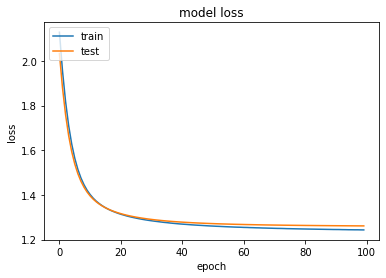

In [59]:
# summarize history for loss
plt.plot(training.history['loss'])
plt.plot(training.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

 ii. Training Accuracy and Validation Accuracy

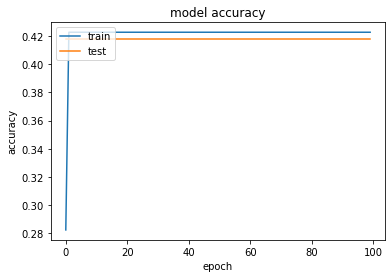

In [61]:
# summarize history for accuracy
plt.plot(training.history['accuracy'])
plt.plot(training.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## D. Design new architecture/update existing architecture in attempt to improve the performance of the model. 

In [63]:
# Design the NN
classifier = Sequential()

# Input Layer
classifier.add(Dense(activation = 'relu', input_dim = 11, units=9, kernel_initializer='he_normal'))

#Normalize the data
classifier.add(tf.keras.layers.BatchNormalization())

# Add dropout
classifier.add(Dropout(0.1))

# Add 1st hidden layer
classifier.add(Dense(9, activation='relu', kernel_initializer='he_normal'))

#Normalize the data
classifier.add(tf.keras.layers.BatchNormalization())

# Add dropout
classifier.add(Dropout(0.1))

# Add output layer
classifier.add(Dense(9, activation = 'softmax', kernel_initializer='uniform'))

# Compile the model
adam_optimizer = tf.keras.optimizers.legacy.Adam(lr=0.001)
classifier.compile(optimizer=adam_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Network Summary
classifier.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 9)                 108       
                                                                 
 batch_normalization_2 (Batc  (None, 9)                36        
 hNormalization)                                                 
                                                                 
 dropout_2 (Dropout)         (None, 9)                 0         
                                                                 
 dense_7 (Dense)             (None, 9)                 90        
                                                                 
 batch_normalization_3 (Batc  (None, 9)                36        
 hNormalization)                                                 
                                                                 
 dropout_3 (Dropout)         (None, 9)                

In [64]:
training = classifier.fit(X_train_scaled, dummy_y_train, 
               validation_data=(X_test_scaled,dummy_y_test), 
               epochs=100, batch_size=32)

Epoch 1/100
25/25 [==============================] - 2s 17ms/step - loss: 2.1888 - accuracy: 0.1179 - val_loss: 2.1415 - val_accuracy: 0.4620
Epoch 2/100
25/25 [==============================] - 0s 5ms/step - loss: 2.1276 - accuracy: 0.3275 - val_loss: 2.1014 - val_accuracy: 0.5117
Epoch 3/100
25/25 [==============================] - 0s 5ms/step - loss: 2.0625 - accuracy: 0.4266 - val_loss: 2.0511 - val_accuracy: 0.5380
Epoch 4/100
25/25 [==============================] - 0s 5ms/step - loss: 1.9903 - accuracy: 0.4567 - val_loss: 1.9836 - val_accuracy: 0.5468
Epoch 5/100
25/25 [==============================] - 0s 5ms/step - loss: 1.9130 - accuracy: 0.4668 - val_loss: 1.9125 - val_accuracy: 0.5585
Epoch 6/100
25/25 [==============================] - 0s 6ms/step - loss: 1.8357 - accuracy: 0.4743 - val_loss: 1.8234 - val_accuracy: 0.5585
Epoch 7/100
25/25 [==============================] - 0s 5ms/step - loss: 1.7581 - accuracy: 0.4918 - val_loss: 1.7392 - val_accuracy: 0.5556
Epoch 8/100


Epoch 59/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9935 - accuracy: 0.5634 - val_loss: 0.9911 - val_accuracy: 0.6228
Epoch 60/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9637 - accuracy: 0.5709 - val_loss: 0.9923 - val_accuracy: 0.6228
Epoch 61/100
25/25 [==============================] - 0s 6ms/step - loss: 0.9713 - accuracy: 0.5634 - val_loss: 0.9928 - val_accuracy: 0.6257
Epoch 62/100
25/25 [==============================] - 0s 6ms/step - loss: 0.9707 - accuracy: 0.5546 - val_loss: 0.9929 - val_accuracy: 0.6228
Epoch 63/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9739 - accuracy: 0.5684 - val_loss: 0.9910 - val_accuracy: 0.6199
Epoch 64/100
25/25 [==============================] - 0s 6ms/step - loss: 0.9728 - accuracy: 0.5709 - val_loss: 0.9877 - val_accuracy: 0.6287
Epoch 65/100
25/25 [==============================] - 0s 6ms/step - loss: 0.9833 - accuracy: 0.5458 - val_loss: 0.9865 - val_accuracy: 0.6287
Epoch 

## E. Plot visuals as in Q3.C and share insights about difference observed in both the models.

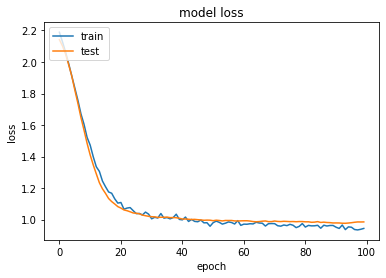

In [65]:
# summarize history for loss
plt.plot(training.history['loss'])
plt.plot(training.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

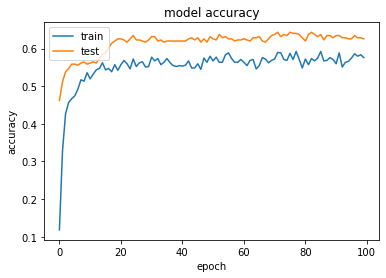

In [66]:
# summarize history for accuracy
plt.plot(training.history['accuracy'])
plt.plot(training.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

**Insights**
* Introducing Batch Normalization and Dropuout has improved the accuracies slightly.
* The first network has a huge gap between the training and test loss above 1.
* The second network has minimized both the losses and the gap between training and test loss is also very low.
* The first network does not have very good test accuracy, while in the second network the test accuracy is higher than the training accuracy.

![alt text](https://drive.google.com/uc?export=view&id=1UXScsVx_Wni_JuDdB8LeTnM6jsPfIwkW)